# Preprocessing human TIL dataset

## Initialisation and reading data

In [1]:
import numpy as np                                # scientific computing toolkit
import pandas as pd                               # data analysis toolkit
import scanpy as sc                               # scanpy is referred to with sc.***
import scvelo as scv                              # RNA velocity toolkit
import matplotlib.pyplot as plt                   # Matplotlib is referred to with plt.***
from scipy import stats                           # for linear regressions
import seaborn as sns                             # for easy heatmaps
import scirpy as ir                               # TCR analysis

sc.settings.verbosity = 0                         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()                         # check if all needed versions are installed and up to date
results_file = './write/results.h5ad'             # the file that will store the analysis results

scanpy==1.4.3 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.1 pandas==1.1.5 scikit-learn==0.21.3 statsmodels==0.11.1 python-igraph==0.7.1+4.bed07760 louvain==0.6.1 leidenalg==0.7.0


In [2]:
sc.settings.set_figure_params(dpi=80, dpi_save=200, color_map='viridis')

In [3]:
adata = sc.read_10x_mtx(
    "./GEX/outs/filtered_feature_bc_matrix/",  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True, gex_only=False)                                # write a cache file for faster subsequent reading
adata.var_names_make_unique()  # this is unnecessary if using 'gene_ids'
adata   # Gives an output of the actual variables stored in adata (cells x genes)

AnnData object with n_obs × n_vars = 6195 × 36604
    var: 'gene_ids', 'feature_types'

## Preprocessing

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

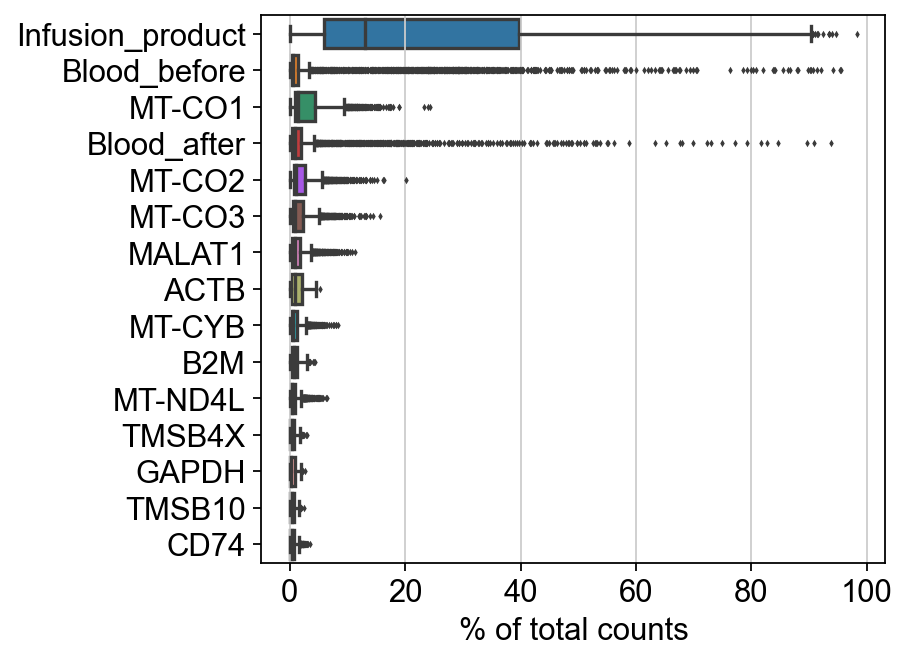

In [4]:
sc.pl.highest_expr_genes(adata, n_top=15)

In the next step we will apply some bacic filters to these cells. Therefore we can control for the minimum number of genes per cell, to take this cell into account. A second filter will filter out genes, which are present in less than a certain number of cells.

In [5]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [6]:
adata_HTO=adata[:, adata.var_names.isin(['Infusion_product','Blood_before','Blood_after'])]
#sc.pp.filter_cells(adata_HTO, max_genes=1)
sc.pp.normalize_per_cell(adata_HTO, counts_per_cell_after=1e4, min_counts=0)
sc.pp.log1p(adata_HTO)
sc.pp.scale(adata_HTO, max_value=10)
sc.tl.pca(adata_HTO)
sc.pp.neighbors(adata_HTO, n_neighbors=30, n_pcs=2)
sc.tl.umap(adata_HTO, spread=5, min_dist=1)
sc.tl.leiden(adata_HTO, resolution=0.1)

Trying to set attribute `.obs` of view, copying.


... storing 'feature_types' as categorical


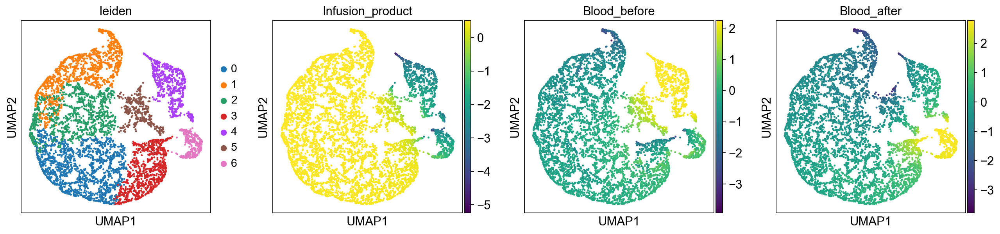

In [7]:
sc.pl.umap(adata_HTO, color=['leiden','Infusion_product','Blood_before','Blood_after'], save='_HTOs.pdf')

In [8]:
print('Barcoding efficacy: '+str((adata_HTO[~adata_HTO.obs.leiden.isin(['5'])].shape[0]/adata_HTO.shape[0])*100)[:4]+' %')
print('Cellnumber Infusion product: '+str(adata_HTO[adata_HTO.obs.leiden.isin(['0','1','2','3'])].shape[0]))
print('Cellnumber Blood before: '+str(adata_HTO[adata_HTO.obs.leiden.isin(['4'])].shape[0]))
print('Cellnumber Blood after: '+str(adata_HTO[adata_HTO.obs.leiden.isin(['6'])].shape[0]))

Barcoding efficacy: 93.8 %
Cellnumber Infusion product: 4694
Cellnumber Blood before: 649
Cellnumber Blood after: 321


In [9]:
adata=adata[:, ~adata.var_names.isin(['Infusion_product','Blood_before','Blood_after'])]

In [10]:
adata.obs['samplename']='None'

Trying to set attribute `.obs` of view, copying.


In [11]:
adata.obs.samplename[adata.obs_names.isin(adata_HTO[adata_HTO.obs.leiden.isin(['0','1','2','3'])].obs_names.tolist())]='Infusion_product'
adata.obs.samplename[adata.obs_names.isin(adata_HTO[adata_HTO.obs.leiden=='4'].obs_names.tolist())]='Blood_before'
adata.obs.samplename[adata.obs_names.isin(adata_HTO[adata_HTO.obs.leiden=='6'].obs_names.tolist())]='Blood_after'

In [12]:
adata=adata[adata.obs.samplename!='None']

Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

In [13]:
mito_genes = adata.var_names.str.startswith('MT-')
adata.obs['percent_mito'] = np.sum(
adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

Trying to set attribute `.obs` of view, copying.


In [14]:
ribo_genes = ((adata.var_names.str.startswith("RPL")) | (adata.var_names.str.startswith("RPS"))| (adata.var_names.str.startswith("MPL")))
adata.obs['percent_ribo'] = np.sum(
adata[:, ribo_genes].X, axis=1) / np.sum(adata.X, axis=1)
adata.var['ribo'] = ribo_genes

A violin plot of the computed quality measures.

... storing 'samplename' as categorical
... storing 'feature_types' as categorical


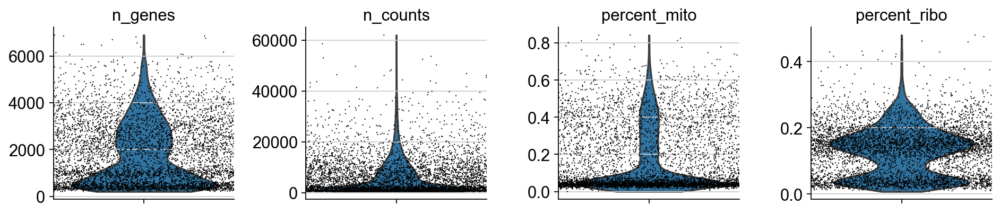

In [15]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.5, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts. First, plot the counts versus the percentage of mitochondrial genes and versus the number of genes to define a threshold for later filtering.

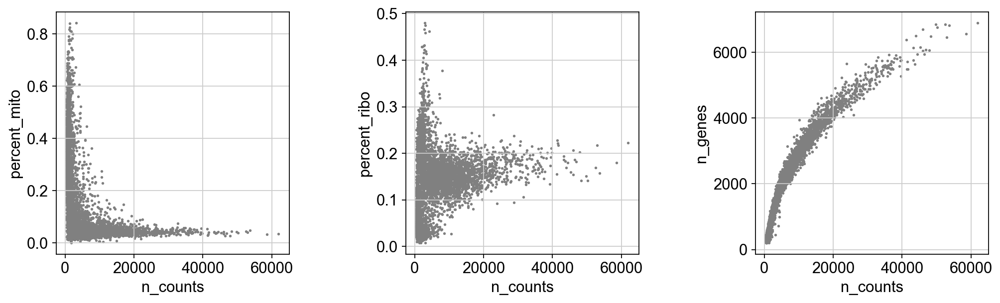

In [16]:
counts = adata.obs['n_counts']
mito = adata.obs['percent_mito']
genes = adata.obs['n_genes']
ribo = adata.obs['percent_ribo']
fig = plt.figure(figsize=(15, 4))
grid = plt.GridSpec(1, 3, hspace=0, wspace=0.5)
percent_mito = fig.add_subplot(grid[0, 0], xlabel='n_counts', ylabel='percent_mito')
percent_ribo = fig.add_subplot(grid[0, 1], xlabel='n_counts', ylabel='percent_ribo')
n_genes = fig.add_subplot(grid[0, 2], xlabel='n_counts', ylabel='n_genes')
percent_mito.scatter(counts, mito, s=2, c='gray')
percent_ribo.scatter(counts, ribo, s=2, c='gray')
n_genes.scatter(counts, genes, s=2, c='gray')

Actually do the filtering from the cut-off defined above.

In [17]:
counts_before=adata.n_obs
adata = adata[adata.obs['n_genes'] < 6000, :]
adata = adata[adata.obs['n_counts'] < 40000, :]
adata = adata[adata.obs['percent_mito'] < 0.4, :]

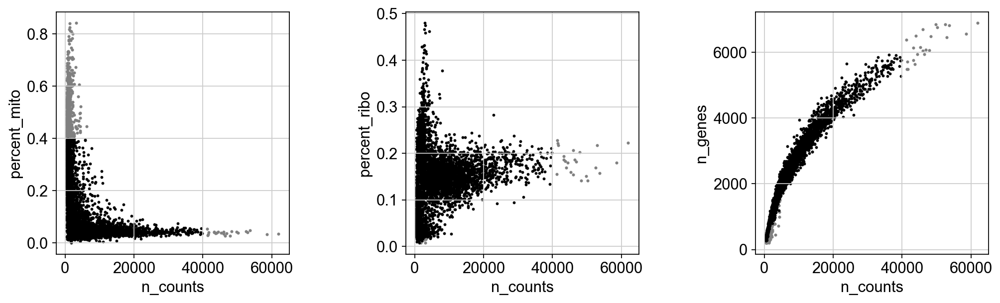

In [18]:
counts2 = adata.obs['n_counts']
mito2 = adata.obs['percent_mito']
genes2 = adata.obs['n_genes']
ribo2 = adata.obs['percent_ribo']

fig = plt.figure(figsize=(15, 4))
grid = plt.GridSpec(1, 3, hspace=0, wspace=0.5)
percent_mito = fig.add_subplot(grid[0, 0], xlabel='n_counts', ylabel='percent_mito')
percent_ribo = fig.add_subplot(grid[0, 1], xlabel='n_counts', ylabel='percent_ribo')
n_genes = fig.add_subplot(grid[0, 2], xlabel='n_counts', ylabel='n_genes')

percent_mito.scatter(counts, mito, s=3, c='gray')
percent_ribo.scatter(counts, ribo, s=3, c='gray')
n_genes.scatter(counts, genes, s=3, c='gray')
percent_mito.scatter(counts2, mito2, s=2, c='black')
percent_ribo.scatter(counts2, ribo2, s=2, c='black')
n_genes.scatter(counts2, genes2, s=2, c='black')

fig.savefig('./figures/filtering.pdf', dpi=2000)

In [19]:
print(str(counts_before)+' --> '+str(adata.n_obs))

5664 --> 4840


Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell, so that counts become comparable among cells.

In [20]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

Trying to set attribute `.obs` of view, copying.


In [21]:
exhaustion_genes=['HAVCR2','PDCD1','LAG3','EOMES','CD101','CD38','TIGIT']
sc.tl.score_genes(adata, exhaustion_genes, score_name='exhaustion_score')

In [22]:
activation_genes=['TNFRSF9','IFNG','TNF','GZMB','PRF1','NKG7','XCL1','XCL2','CCL3','CCL4','CCL5','CST7','STAT1','TGFB1']
sc.tl.score_genes(adata, activation_genes, score_name='activation_score')

In [23]:
naive_like_state_genes=['TCF7','CCR7','SELL','LEF1','IL7R']
predysfunctional_state_genes=['EOMES', 'GZMK', 'CXCR3']
dysfunctional_state_genes=['LAG3', 'PDCD1', 'LAYN', 'HAVCR2','CTLA4']
cytotoxic_state_genes=['KLRG1','PRF1','FCGR3A','CX3CR1']
cytotoxic_activation=['CCL5', 'GZMK', 'GNLY', 'EOMES', 'ZNF683','KLRG1', 'NKG7', 'ZEB2']
cytokine_activation=['CCL3', 'IFNG', 'CCL4', 'XCL1', 'XCL2', 'CSF2', 'IL10', 'HOPX', 'TIM3', 'LAG3', 'PRF1', 'TNFRSF9', 'NKG7', 'IL26']
sc.tl.score_genes(adata, naive_like_state_genes, score_name='naive_like_state')
sc.tl.score_genes(adata, predysfunctional_state_genes, score_name='predysfunctional_state')
sc.tl.score_genes(adata, dysfunctional_state_genes, score_name='dysfunctional_state')
sc.tl.score_genes(adata, cytotoxic_state_genes, score_name='cytotoxic_state')
sc.tl.score_genes(adata, dysfunctional_state_genes, score_name='cytotoxic_activation')
sc.tl.score_genes(adata, cytotoxic_state_genes, score_name='cytokine_activation')

## Cell cycle scoring

In [24]:
cc_genes=pd.read_csv("./analysis_info/regev_lab_cell_cycle_genes.txt")
s_genes=cc_genes[:46]
g2m_genes=cc_genes[47:]
s_genes.columns=['genes']
g2m_genes.columns=['genes']
sc.tl.score_genes_cell_cycle(adata, s_genes.genes, g2m_genes.genes)

... storing 'phase' as categorical


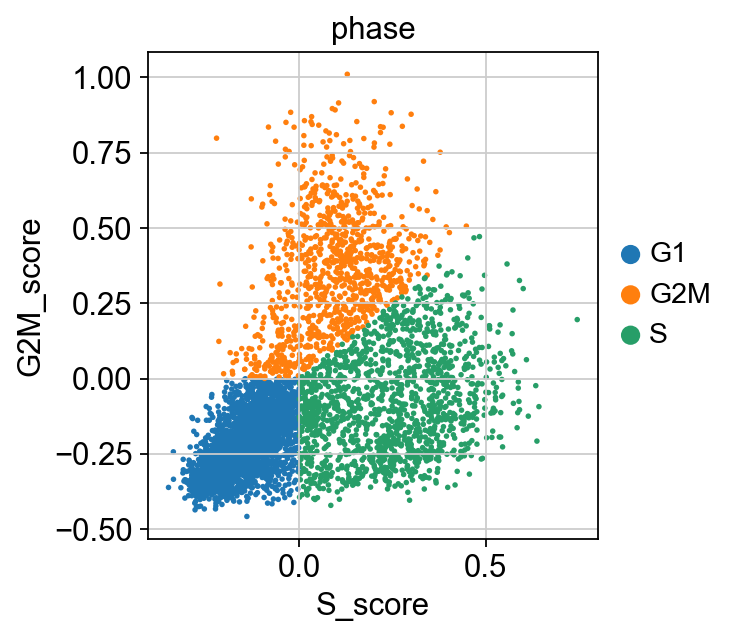

In [25]:
sc.pl.scatter(adata, x='S_score', y='G2M_score', color='phase')

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the "relevant data" for visualization and differential testing, some would prefer to store the unnormalized data.

In [26]:
adata.raw = adata

Identify highly-variable genes.

In [27]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [28]:
adata = adata[:, adata.var['highly_variable']]
sc.pp.regress_out(adata, ['n_counts', 'percent_mito', 'S_score', 'G2M_score'])
sc.pp.scale(adata, max_value=10)

In [29]:
# Remove TCR chains
adata=adata[:,adata.var_names[~np.logical_or(adata.var_names.str.contains('TRB'),
                               adata.var_names.str.contains('TRA'))]]

## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [30]:
sc.tl.pca(adata, svd_solver='arpack')

We can make a scatter plot in the PCA coordinates, but we will not use that later on.

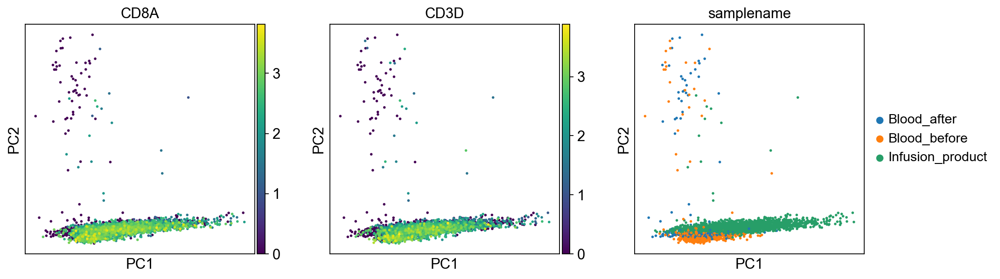

In [31]:
sc.pl.pca(adata, color=['CD8A', 'CD3D','samplename'])

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

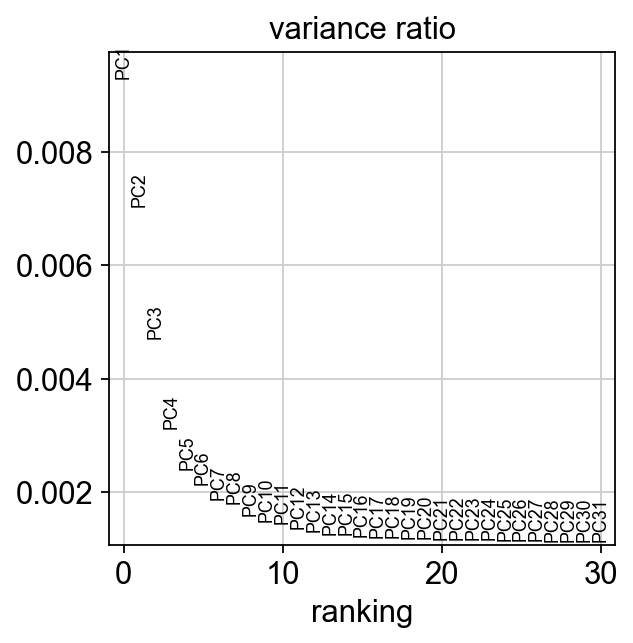

In [32]:
sc.pl.pca_variance_ratio(adata)

## Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

In [33]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=6)

## Embedding the neighborhood graph

In [34]:
sc.tl.umap(adata, min_dist=0.7)

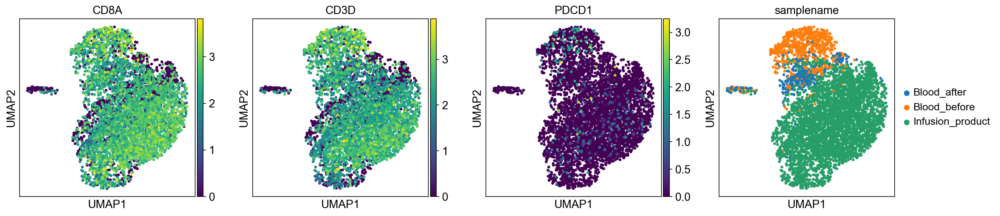

In [35]:
sc.pl.umap(adata, color=['CD8A', 'CD3D','PDCD1','samplename'],s=50)

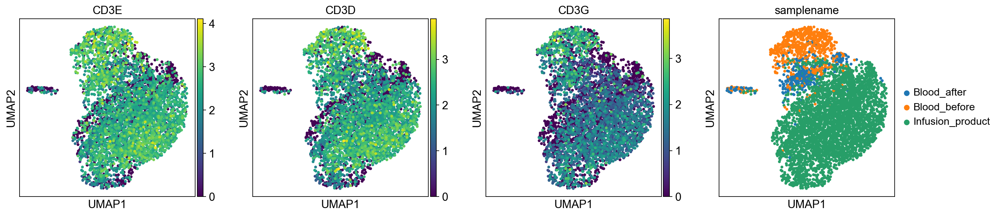

In [36]:
sc.pl.umap(adata, color=['CD3E', 'CD3D','CD3G','samplename'],s=50)

## Clustering the neighborhood graph

In [37]:
from sklearn.metrics import silhouette_score
def titrate_leiden_resolution(adata):
    res_array=list(np.round(np.linspace(.1, 2, 20),1))
    silhoutte_list=list()
    sc.settings.verbosity = 1
    for i,res in enumerate(res_array):
        sc.tl.leiden(adata, resolution=res)
        if adata.obs.leiden.unique().shape[0]>2:
            silhoutte_list.append(silhouette_score(adata.obsm['X_umap'],
                    adata.obs[f'leiden'],
                    metric='euclidean'))
        else:
            silhoutte_list.append(np.nan)
        print(str(np.round(((i+1)/len(res_array))*100,1))+"%", end="\r", flush=True)
    sns.lineplot(res_array, silhoutte_list, color='black', markers='o')

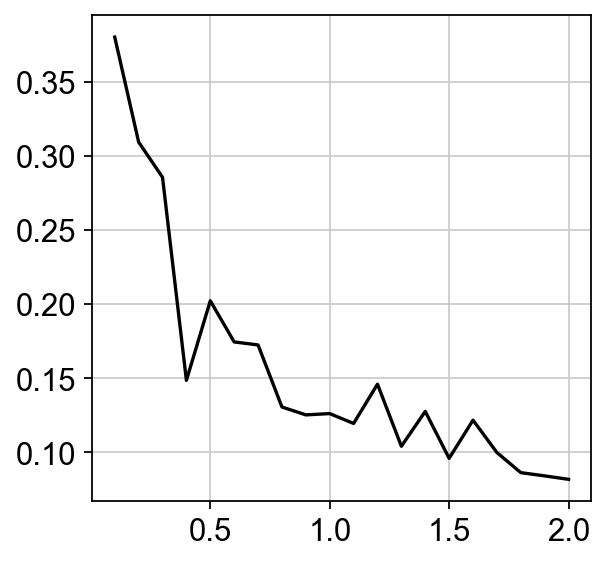

In [38]:
titrate_leiden_resolution(adata)

In [39]:
sc.tl.leiden(adata, resolution=0.3)
print(silhouette_score(adata.obsm['X_umap'],adata.obs[f'leiden'],metric='euclidean'))

0.28545216


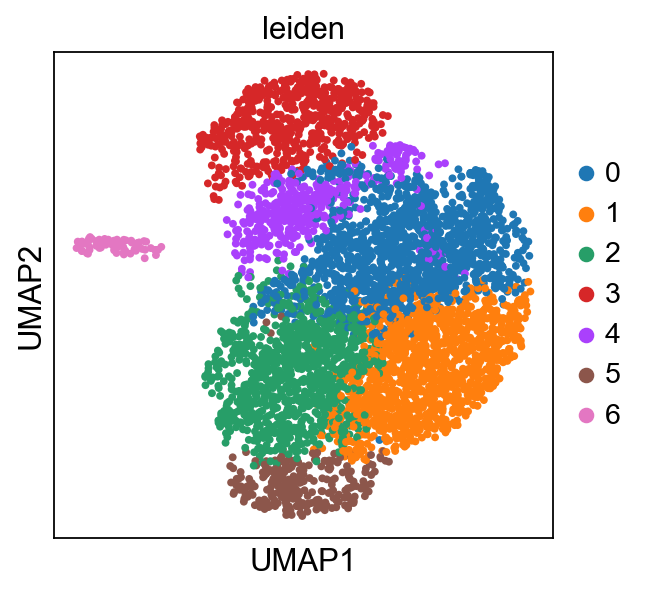

In [40]:
sc.pl.umap(adata, color=['leiden'], save='_leiden.pdf', s=50)

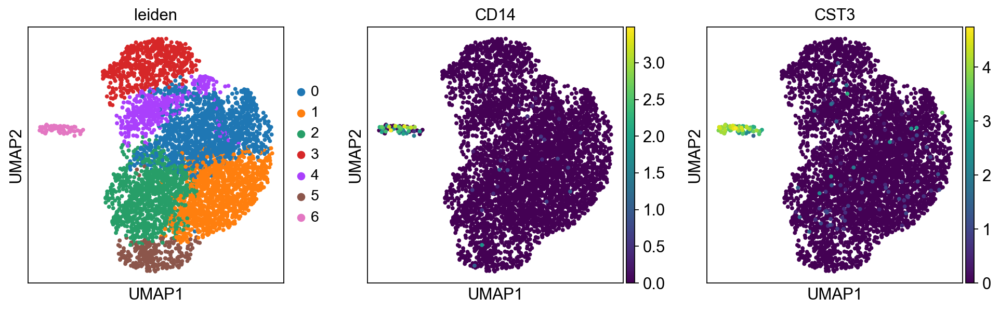

In [41]:
sc.pl.umap(adata, color=['leiden','CD14','CST3'], save='_leiden.pdf', s=50)

{'mainplot_ax': <matplotlib.axes._subplots.AxesSubplot at 0x16726c1bc18>,
 'group_extra_ax': <matplotlib.axes._subplots.AxesSubplot at 0x16726dccda0>,
 'gene_group_ax': <matplotlib.axes._subplots.AxesSubplot at 0x16726db7f98>,
 'size_legend_ax': <matplotlib.axes._subplots.AxesSubplot at 0x16726edc400>,
 'color_legend_ax': <matplotlib.axes._subplots.AxesSubplot at 0x16726ee76a0>}

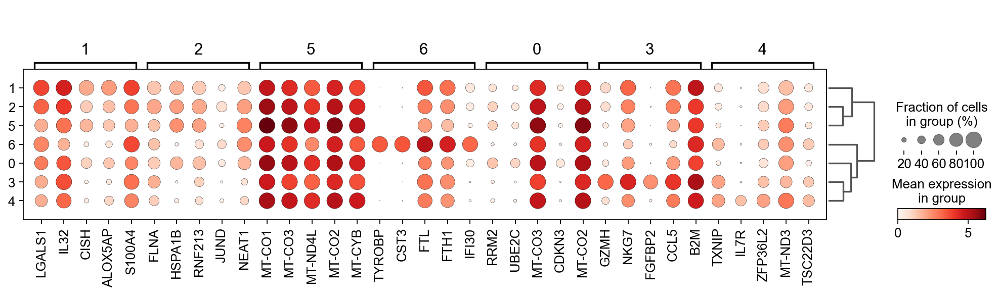

In [42]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.tl.rank_genes_groups(adata, 'leiden', use_raw=True, method='t-test')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, show=False)

# TCR analysis scirpy

In [43]:
adata_TCR=ir.io.read_10x_vdj('./VDJ/outs/all_contig_annotations.csv')

... storing 'TRA_1_cdr3' as categorical
... storing 'TRA_2_cdr3' as categorical
... storing 'TRB_1_cdr3' as categorical
... storing 'TRB_2_cdr3' as categorical
... storing 'TRA_1_junction_ins' as categorical
... storing 'TRA_2_junction_ins' as categorical
... storing 'TRB_1_junction_ins' as categorical
... storing 'TRB_2_junction_ins' as categorical
... storing 'TRA_1_v_gene' as categorical
... storing 'TRA_2_v_gene' as categorical
... storing 'TRB_1_v_gene' as categorical
... storing 'TRB_2_v_gene' as categorical
... storing 'TRB_1_d_gene' as categorical
... storing 'TRB_2_d_gene' as categorical
... storing 'TRA_1_j_gene' as categorical
... storing 'TRA_2_j_gene' as categorical
... storing 'TRB_1_j_gene' as categorical
... storing 'TRB_2_j_gene' as categorical
... storing 'TRA_1_c_gene' as categorical
... storing 'TRA_2_c_gene' as categorical
... storing 'TRB_1_c_gene' as categorical
... storing 'TRB_2_c_gene' as categorical
... storing 'TRA_1_cdr3_nt' as categorical
... storing 'TRA_

In [44]:
ir.pp.merge_with_tcr(adata, adata_TCR)

... storing 'multi_chain' as categorical
... storing 'has_tcr' as categorical


In [45]:
ir.tl.chain_pairing(adata)

... storing 'chain_pairing' as categorical


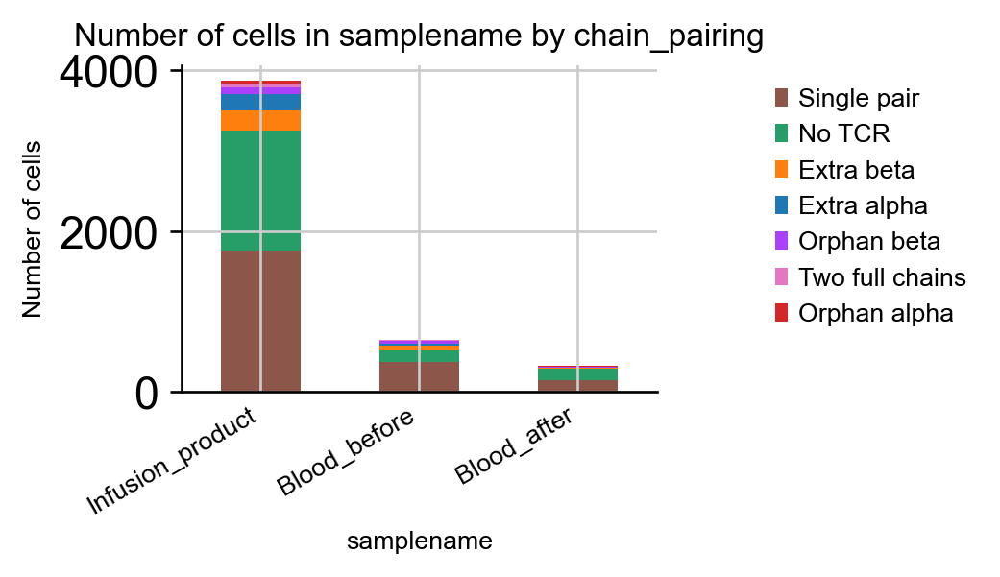

In [46]:
ir.pl.group_abundance(adata, groupby="samplename", target_col="chain_pairing")

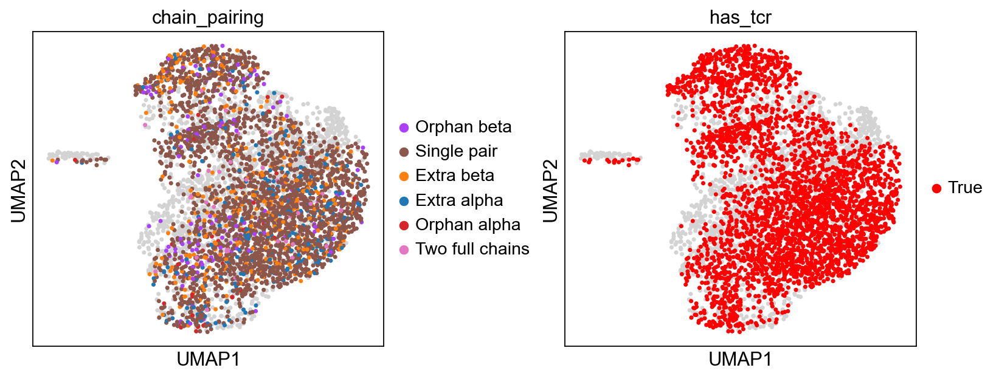

In [47]:
fig, ax = plt.subplots(ncols=2, figsize=(10,4))
fig.tight_layout(w_pad=7)
sc.pl.umap(adata, color="chain_pairing", ax=ax[0], show=False, s=40, groups=adata.obs.chain_pairing[adata.obs.chain_pairing!='No TCR'].unique().tolist())
sc.pl.umap(adata, color="has_tcr", palette=['gray','red'], ax=ax[1], show=False, s=40, groups="True")

In [48]:
#print('TCR sequencing efficiency: '+str(np.round(adata.obs.has_tcr.value_counts(normalize=True)[1]*100,1))+'%')
print('Unique CDR3 alpha: '+str(adata.obs.TRA_1_cdr3.append(adata.obs.TRA_1_cdr3).nunique()))
print('Unique CDR3 beta: '+str(adata.obs.TRB_1_cdr3.append(adata.obs.TRB_1_cdr3).nunique()))

Unique CDR3 alpha: 239
Unique CDR3 beta: 255


In [49]:
print(
    "Fraction of cells with more than one pair of TCRs: {:.2f}".format(
        np.sum(
            adata.obs["chain_pairing"].isin(
                ["Extra beta", "Extra alpha", "Two full chains"]
            )
        )
        / adata.n_obs
    )
)

Fraction of cells with more than one pair of TCRs: 0.12


In [50]:
ir.pp.tcr_neighbors(adata, receptor_arms="all", dual_tcr="all")
ir.tl.define_clonotypes(adata)

100%|████████████████████████████████████████████████████████████████████| 2645900/2645900 [00:24<00:00, 106848.29it/s]


... storing 'clonotype' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000016724E1D9B0>,
      dtype=object)

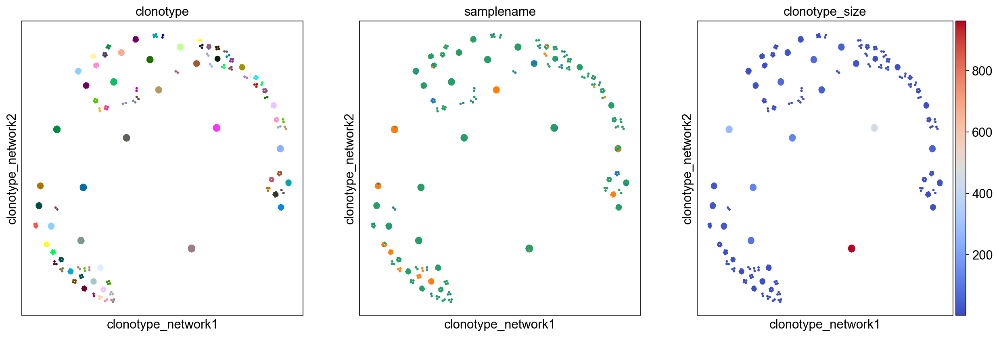

In [51]:
ir.tl.clonotype_network(adata, layout='fr', min_size=2)
ir.pl.clonotype_network(adata, color=["clonotype","samplename","clonotype_size"], legend_loc="none", color_map="coolwarm", panel_size=(6, 6), size=30)

In [52]:
adata.obs.chain_pairing.unique()

['Orphan beta', 'Single pair', 'No TCR', 'Extra beta', 'Extra alpha', 'Orphan alpha', 'Two full chains']
Categories (7, object): ['Orphan beta', 'Single pair', 'No TCR', 'Extra beta', 'Extra alpha', 'Orphan alpha', 'Two full chains']

In [53]:
additional_chain_clones=adata[np.logical_and(adata.obs.chain_pairing.isin(['Extra beta', 'Extra alpha']),
                                            adata.obs.clonotype_size>1)].obs.clonotype.unique().tolist()

In [54]:
additional_chain_clones=additional_chain_clones+['2','4','5','13','14','23','49','74','184','471']

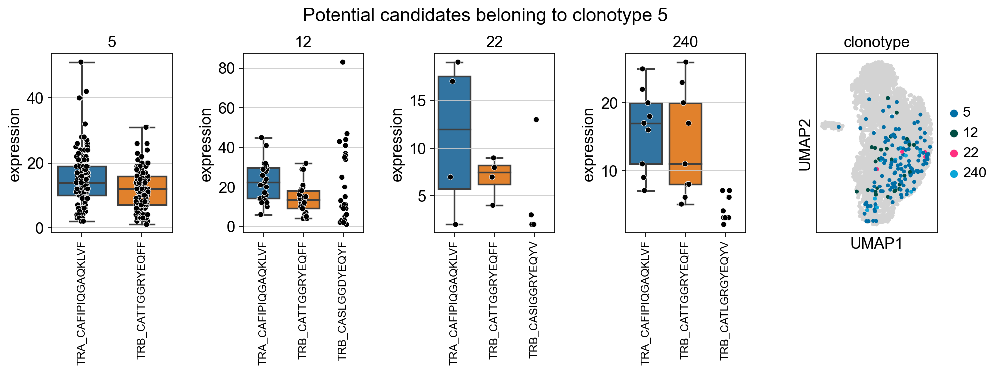

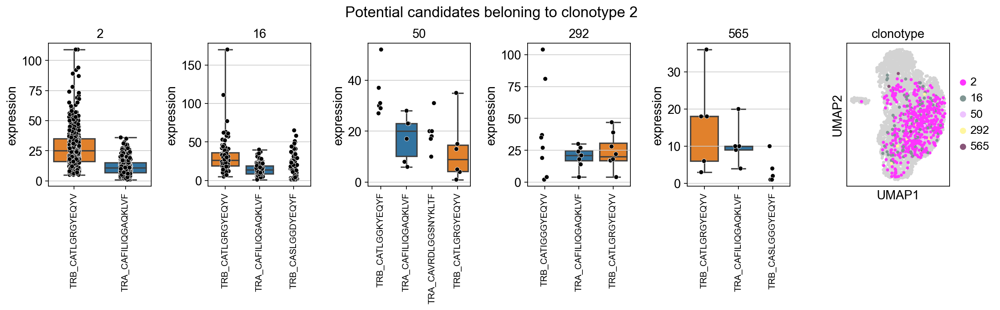

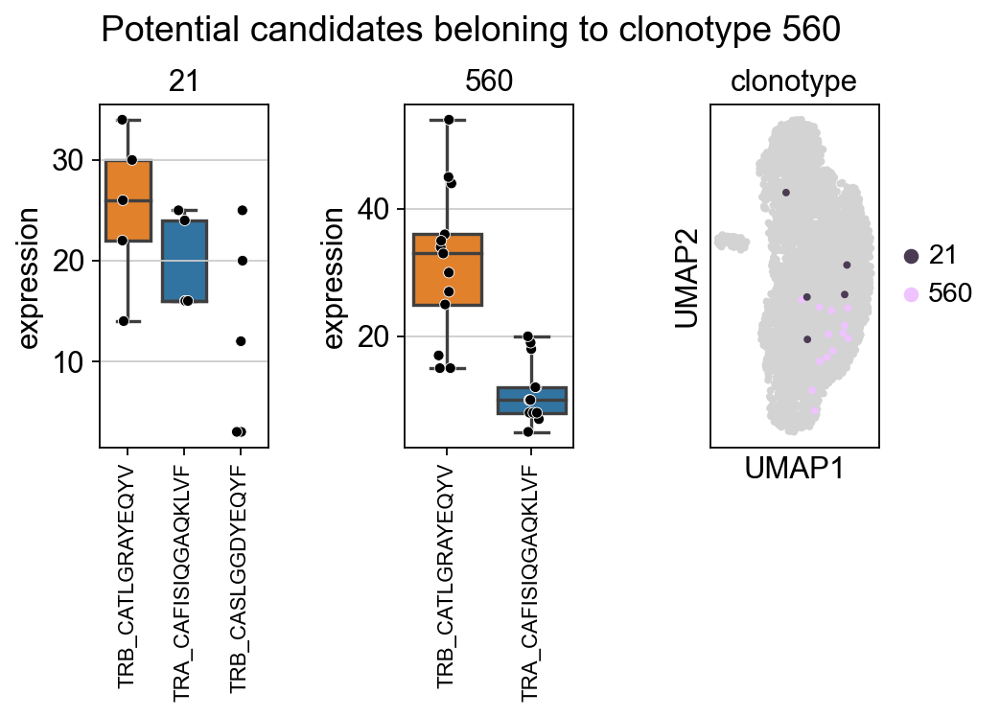

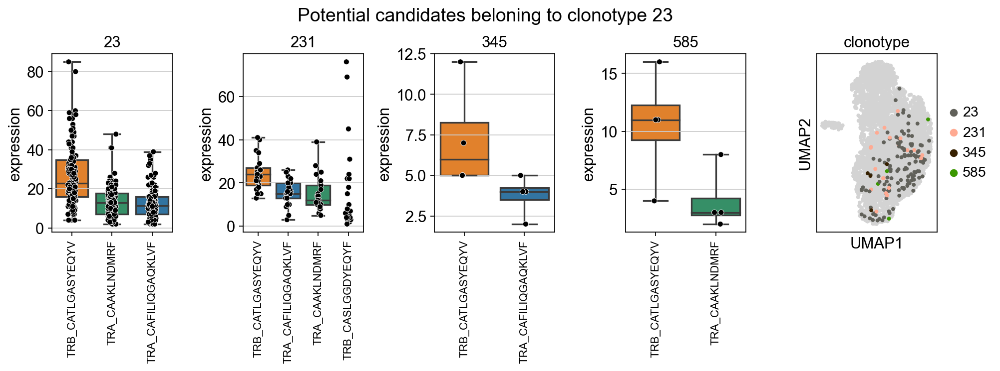

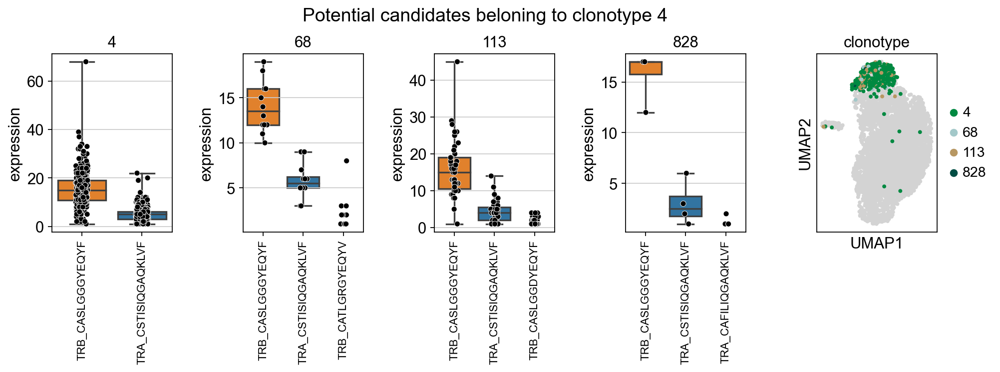

...

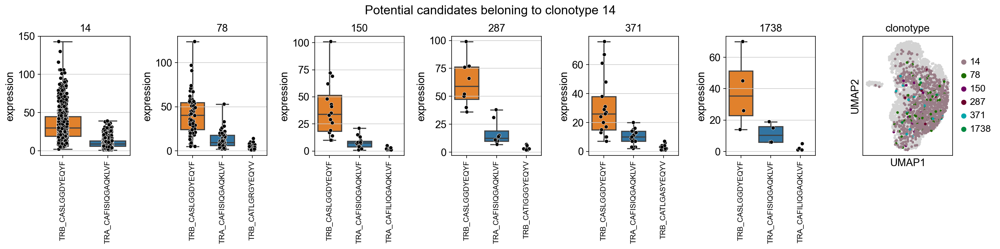

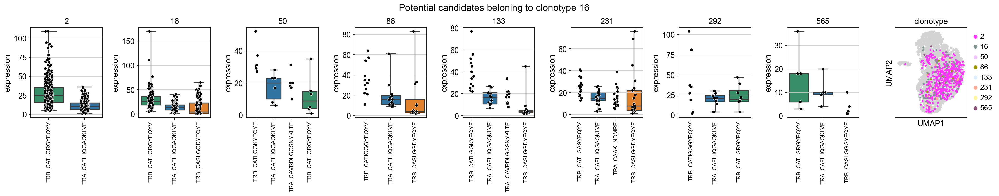

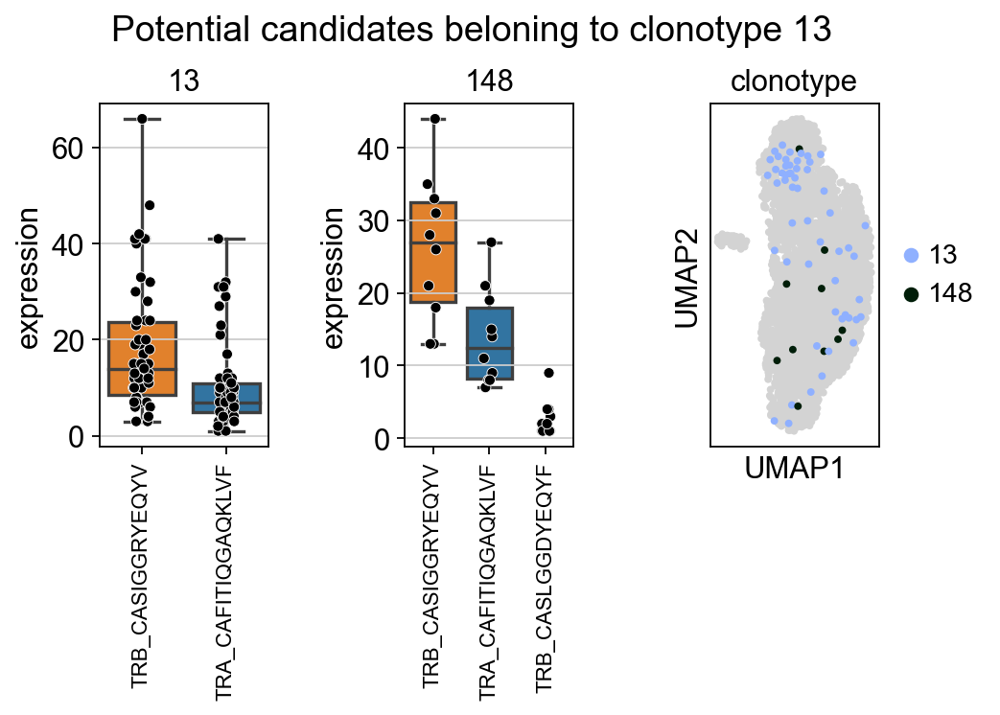

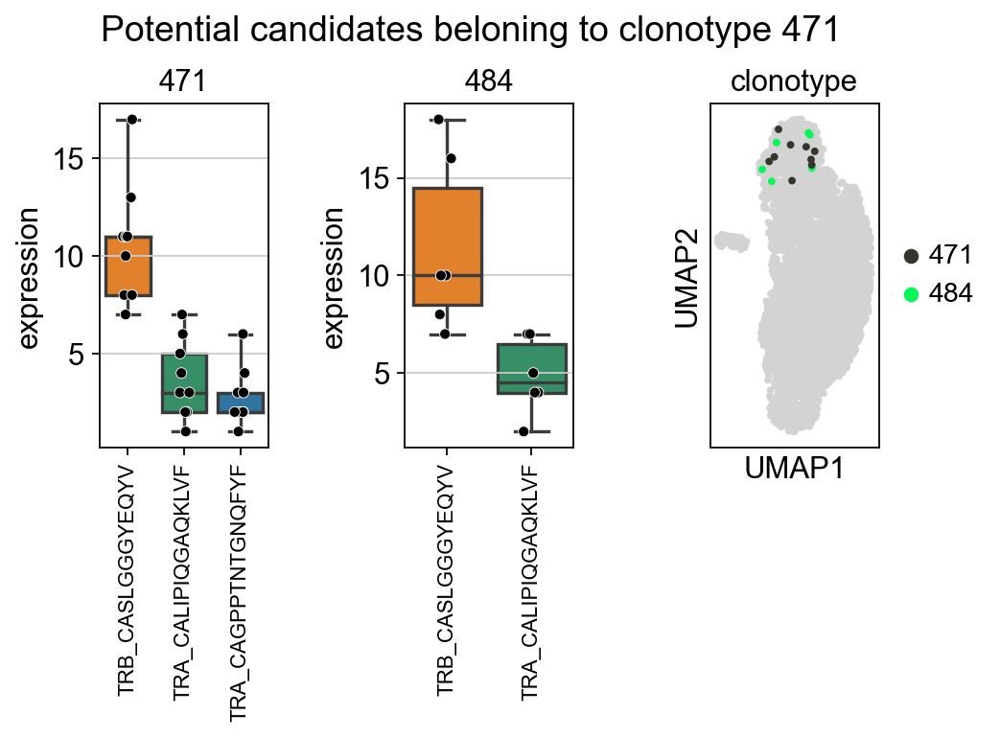

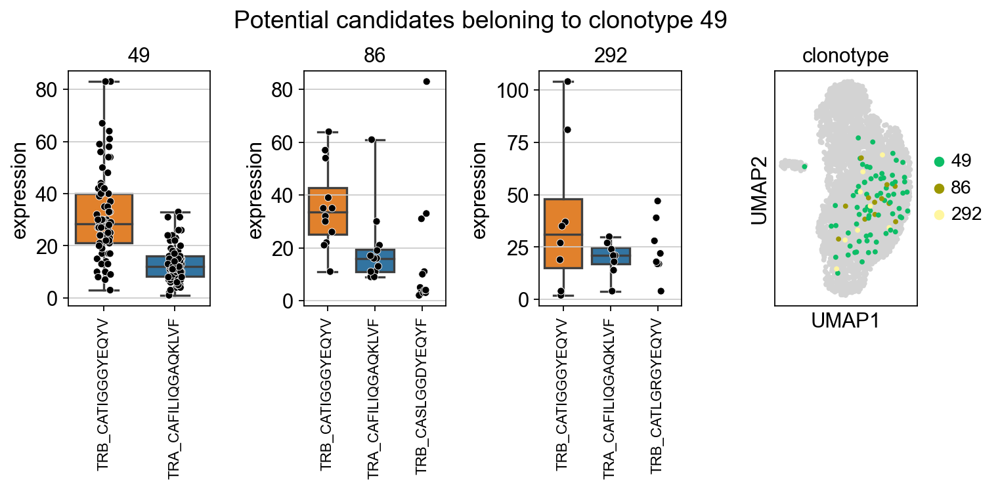

In [55]:
already_plotted=[]
for j,clone in enumerate(additional_chain_clones):
    candidates=adata.obs[(adata.obs.TRB_1_cdr3.isin(adata[adata.obs.clonotype==clone].obs.TRB_1_cdr3.unique().tolist()))&(adata.obs.TRA_1_cdr3.isin(adata[adata.obs.clonotype==clone].obs.TRA_1_cdr3.unique().tolist()))].clonotype.unique()
    candidates=adata.obs[adata.obs.clonotype.isin(candidates)&(adata.obs.clonotype_size>3)].clonotype.unique().tolist()
    biggest_candidate=adata[adata.obs.clonotype.isin(candidates)].obs.groupby('clonotype').agg({'clonotype_size':'mean'}).sort_values('clonotype_size', ascending=False).index[0]
    hue_order=['TRA_'+adata[adata.obs.clonotype==biggest_candidate].obs.TRA_1_cdr3.unique().tolist()[0],'TRB_'+adata[adata.obs.clonotype==biggest_candidate].obs.TRB_1_cdr3.unique().tolist()[0]]
    if adata[adata.obs.clonotype==biggest_candidate].obs.chain_pairing[0]=='Extra alpha':
        hue_order=hue_order+['TRA_'+adata[adata.obs.clonotype==biggest_candidate].obs.TRA_2_cdr3.unique().tolist()[0]]
    if adata[adata.obs.clonotype==biggest_candidate].obs.chain_pairing[0]=='Extra beta':
        hue_order=hue_order+['TRB_'+adata[adata.obs.clonotype==biggest_candidate].obs.TRB_2_cdr3.unique().tolist()[0]]
    
    clone=biggest_candidate
    candidates=adata.obs[(adata.obs.TRB_1_cdr3.isin(adata[adata.obs.clonotype==clone].obs.TRB_1_cdr3.unique().tolist()))&(adata.obs.TRA_1_cdr3.isin(adata[adata.obs.clonotype==clone].obs.TRA_1_cdr3.unique().tolist()))].clonotype.unique()
    candidates=adata.obs[adata.obs.clonotype.isin(candidates)&(adata.obs.clonotype_size>3)].clonotype.unique().tolist()
    ncols=len(candidates)+1
    if ((clone in already_plotted)==False) & (len(candidates)>1):
        fig,ax=plt.subplots(ncols=ncols, figsize=(len(candidates)*3,3))
        fig.tight_layout(w_pad=2, h_pad=10)
        fig.suptitle('Potential candidates beloning to clonotype '+clone, y=1.1)
        for i, clonotype in enumerate(candidates):
            CDR3s=('TRB_'+adata.obs[adata.obs.clonotype==clonotype]['TRB_1_cdr3'].astype(str)).tolist()+ \
            ('TRB_'+adata.obs[adata.obs.clonotype==clonotype]['TRB_2_cdr3'].astype(str)).tolist()+ \
            ('TRA_'+adata.obs[adata.obs.clonotype==clonotype]['TRA_1_cdr3'].astype(str)).tolist()+ \
            ('TRA_'+adata.obs[adata.obs.clonotype==clonotype]['TRA_2_cdr3'].astype(str)).tolist()

            expression=adata.obs[adata.obs.clonotype==clonotype]['TRB_1_expr'].tolist()+ \
            adata.obs[adata.obs.clonotype==clonotype]['TRB_2_expr'].tolist()+ \
            adata.obs[adata.obs.clonotype==clonotype]['TRA_1_expr'].tolist()+ \
            adata.obs[adata.obs.clonotype==clonotype]['TRA_2_expr'].tolist()

            df_plot=pd.DataFrame([CDR3s,expression]).T
            df_plot.columns=['sequence','expression']
            df_plot=df_plot[~df_plot.sequence.isin(['TRA_None','TRB_None'])]
            df_plot.expression=df_plot.expression.astype(int)
            order=df_plot.groupby('sequence').median().sort_values('expression', ascending=False).index.tolist()
            sns.boxplot(data=df_plot, x='sequence', y='expression',ax=ax.reshape(-1)[i], hue='sequence', hue_order=hue_order,fliersize=0, whis=[0, 100], order=order, dodge=False)
            sns.stripplot(data=df_plot, x='sequence', y='expression',ax=ax.reshape(-1)[i], edgecolor='white', linewidth=0.4, order=order, color='black')
            ax.reshape(-1)[i].set_xticklabels(ax.reshape(-1)[i].get_xticklabels(),rotation=90, size=10)
            ax.reshape(-1)[i].set_title(clonotype)
            ax.reshape(-1)[i].set_xlabel('')
            ax.reshape(-1)[i].get_legend().remove()
        sc.pl.umap(adata, color='clonotype', groups=candidates, s=50, show=False, ax=ax.reshape(-1)[i+1])
        plt.savefig('./clonotype_annotation/clonotypes_candidates_belonging_to_'+clone+'.pdf', bbox_inches='tight')
        plt.show()
    already_plotted=already_plotted+[clone]

In [56]:
adata.obs['clonotype_group']=adata.obs['clonotype']
adata.obs['clonotype_group_size']=adata.obs['clonotype_size']

In [57]:
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['2','16','565'])]='2'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='2']=sum(adata.obs[adata.obs.clonotype.isin(['2','16','565'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['4','68','113','828'])]='4'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='4']=sum(adata.obs[adata.obs.clonotype.isin(['4','68','113','828'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['5','12','22','240'])]='5'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='5']=sum(adata.obs[adata.obs.clonotype.isin(['5','12','22','240'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['13','148'])]='13'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='13']=sum(adata.obs[adata.obs.clonotype.isin(['13','148'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['14','78','150','287','371','1738'])]='14'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='14']=sum(adata.obs[adata.obs.clonotype.isin(['14','78','150','287','371','1738'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['23','231','345','585'])]='23'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='23']=sum(adata.obs[adata.obs.clonotype.isin(['23','231','345','585'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['49','86','292'])]='49'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='49']=sum(adata.obs[adata.obs.clonotype.isin(['49','86','292'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['50','74','133','498'])]='74'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='74']=sum(adata.obs[adata.obs.clonotype.isin(['50','74','133','498'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['471','484'])]='471'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='471']=sum(adata.obs[adata.obs.clonotype.isin(['471','484'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())
adata.obs['clonotype_group'][adata.obs.clonotype.isin(['560','21'])]='560'
adata.obs['clonotype_group_size'][adata.obs.clonotype_group=='560']=sum(adata.obs[adata.obs.clonotype.isin(['560','21'])].groupby('clonotype')['clonotype_size'].agg('first').fillna(0).unique().tolist())

In [58]:
adata.obs['clonotype_old']=adata.obs['clonotype']
adata.obs['clonotype_size_old']=adata.obs['clonotype_size']
adata.obs['clonotype']=adata.obs['clonotype_group']
adata.obs['clonotype_size']=adata.obs['clonotype_group_size']

In [59]:
ir.pp.tcr_neighbors(adata, receptor_arms="all", dual_tcr="all", metric="identity", sequence="aa")
ir.tl.define_clonotype_clusters(adata, metric="identity", sequence="aa")

100%|████████████████████████████████████████████████████████████████████| 2949618/2949618 [00:27<00:00, 107478.32it/s]


... storing 'ct_cluster_aa_identity' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001672B1E5D30>,
      dtype=object)

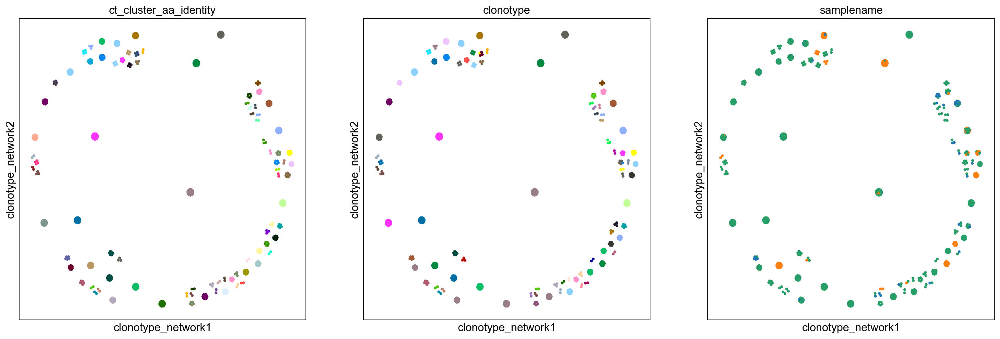

In [60]:
ir.tl.clonotype_network(adata, layout="fr", metric="identity", sequence="aa", min_size=2)
ir.pl.clonotype_network(adata, color=["ct_cluster_aa_identity", "clonotype", "samplename"], legend_loc="none", panel_size=(7, 7), size=50)

In [61]:
ir.pp.tcr_neighbors(
    adata,
    metric="alignment",
    sequence="aa",
    cutoff=3,
    receptor_arms="all",
    dual_tcr="any",
    n_jobs=8
)
ir.tl.define_clonotype_clusters(
    adata, partitions='connected', sequence="aa", metric="alignment"
)

100%|█████████████████████████████████████████████████████████████████████| 3071096/3071096 [00:36<00:00, 83137.49it/s]


... storing 'ct_cluster_aa_alignment' as categorical


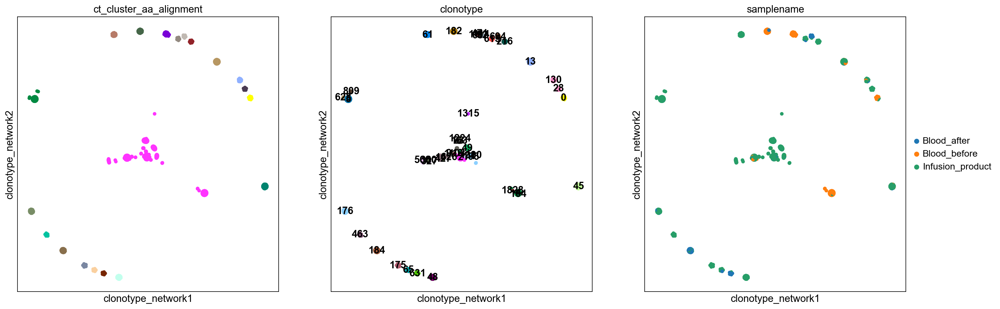

In [62]:
ir.tl.clonotype_network(adata, layout="fr", metric="alignment", sequence="aa", min_size=5)
ir.pl.clonotype_network(adata, color=["ct_cluster_aa_alignment", "clonotype", "samplename"], 
                        panel_size=(7, 7), size=100)
plt.savefig('./figures/clonotype_alignement.pdf')

In [63]:
adata_infusion = adata[adata.obs['samplename']=='Infusion_product',:]
adata_blood_before = adata[adata.obs['samplename']=='Blood_before',:]
adata_blood_after = adata[adata.obs['samplename']=='Blood_after',:]

In [64]:
single_donor_adatas=[adata_infusion,adata_blood_before,adata_blood_after]
single_donor_adatas_names=['Infusion_product','Blood_before','Blood_after']

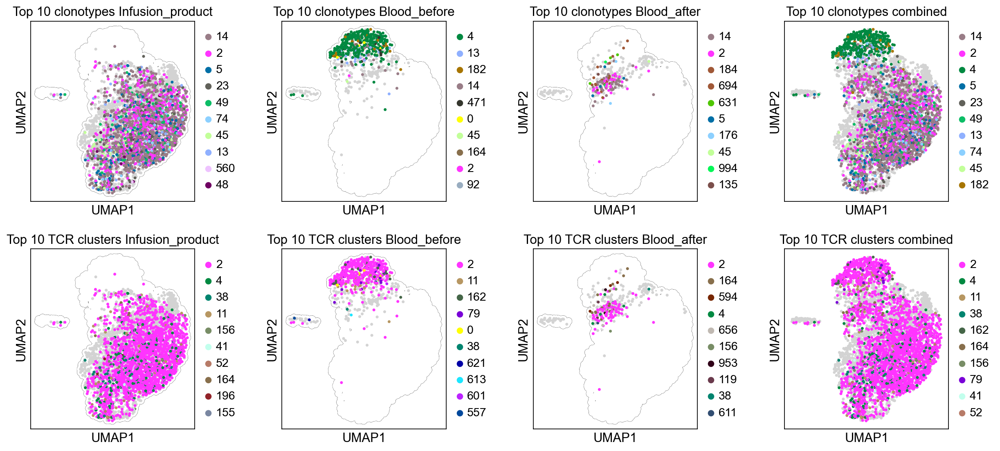

In [65]:
fig, ax =plt.subplots(ncols=len(single_donor_adatas)+1, nrows=2, figsize=(15,7))
fig.tight_layout(w_pad=4, h_pad=2)
for i, adata_s in enumerate (single_donor_adatas):
    sc.pl.umap(adata, ax=ax[0,i], alpha=0, show=False, s=200, add_outline=True, outline_width=(0.02,0.05))
    sc.pl.umap(adata, ax=ax[1,i], alpha=0, show=False, s=200, add_outline=True, outline_width=(0.02,0.05))
    sc.pl.umap(adata_s, color='ct_cluster_aa_alignment', 
               groups=adata_s.obs.ct_cluster_aa_alignment.value_counts().index[:10].astype(str).tolist(), 
               ax=ax[1,i], show=False, title='Top 10 TCR clusters '+single_donor_adatas_names[i], s=40)
    sc.pl.umap(adata_s, color='clonotype', 
               groups=adata_s.obs.clonotype.value_counts().index[:10].astype(str).tolist(), 
               ax=ax[0,i], show=False, title='Top 10 clonotypes '+single_donor_adatas_names[i], s=40)
sc.pl.umap(adata, color='ct_cluster_aa_alignment', 
           groups=adata.obs.ct_cluster_aa_alignment.value_counts().index[:10].astype(str).tolist(), 
           ax=ax[1,3], show=False, title='Top 10 TCR clusters combined', s=40)
sc.pl.umap(adata, color='clonotype', 
           groups=adata.obs.clonotype.value_counts().index[:10].astype(str).tolist(), 
           ax=ax[0,3], show=False, title='Top 10 clonotypes combined', s=40)
fig.savefig('./figures/clonotypes_clusters_donors.svg')

Text(110.27777777777779, 0.5, '# cells')

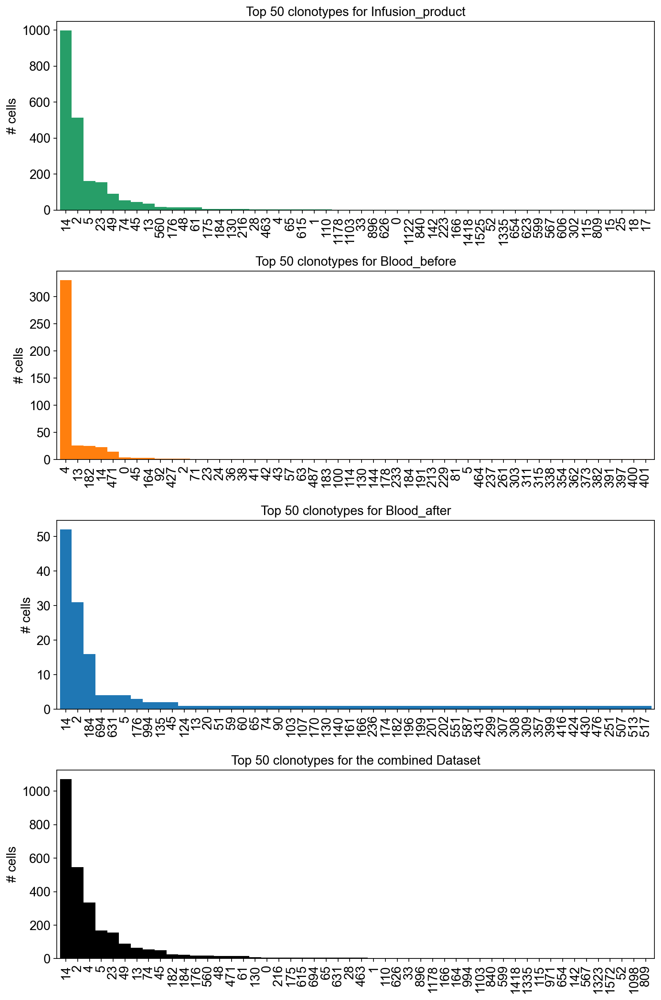

In [66]:
fig, ax=plt.subplots(nrows=4, figsize=(10,15))
fig.tight_layout(h_pad=3)
for i, adata_s in enumerate(single_donor_adatas):
    adata_s.obs.clonotype.value_counts().sort_values(ascending=False)[:50].plot(kind='bar', ax=ax[i], width=1, color=adata_s.uns['samplename_colors'][0])
    ax[i].grid(False)
    ax[i].set_title('Top 50 clonotypes for '+single_donor_adatas_names[i])
    ax[i].set_ylabel('# cells')
    #ax[i].set_ylim(0,900)
adata.obs.clonotype.value_counts().sort_values(ascending=False)[:50].plot(kind='bar', ax=ax[3], width=1, color = 'black')
ax[3].grid(False)
ax[3].set_title('Top 50 clonotypes for the combined Dataset')
ax[3].set_ylabel('# cells')

Text(23.877777777777773, 0.5, '# cells')

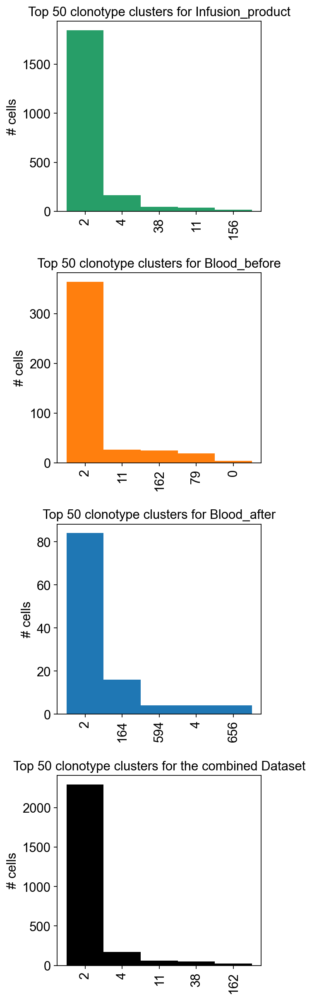

In [67]:
fig, ax=plt.subplots(nrows=4, figsize=(4,15))
fig.tight_layout(h_pad=3)
for i, adata_s in enumerate(single_donor_adatas):
    adata_s.obs.ct_cluster_aa_alignment.value_counts().sort_values(ascending=False)[:5].plot(kind='bar', ax=ax[i], width=1, color=adata_s.uns['samplename_colors'][0])
    ax[i].grid(False)
    ax[i].set_title('Top 50 clonotype clusters for '+single_donor_adatas_names[i])
    ax[i].set_ylabel('# cells')
    #ax[i].set_ylim(0,900)
adata.obs.ct_cluster_aa_alignment.value_counts().sort_values(ascending=False)[:5].plot(kind='bar', ax=ax[3], width=1, color = 'black')
ax[3].grid(False)
ax[3].set_title('Top 50 clonotype clusters for the combined Dataset')
ax[3].set_ylabel('# cells')

In [68]:
ir.tl.clonal_expansion(adata, clip_at=1500)

In [69]:
adata.obs['clonal_expansion']=adata.obs['clonal_expansion'].astype(int)

In [70]:
adata.obs[adata.obs.ct_cluster_aa_alignment_size>=2].to_csv('clonotypes.csv')

In [71]:
clonotypes_re_expression=['2','4','5','13','14','23','49','74','184','471']

In [72]:
df=adata.obs

In [73]:
df['PD1']=[x[0] for x in adata.raw[:,'PDCD1'].X.todense().tolist()]
df['CD39']=[x[0] for x in adata.raw[:,'ENTPD1'].X.todense().tolist()]
df['CX3CR1']=[x[0] for x in adata.raw[:,'CX3CR1'].X.todense().tolist()]
df['NKG2D']=[x[0] for x in adata.raw[:,'KLRK1'].X.todense().tolist()]
df['GZMK']=[x[0] for x in adata.raw[:,'GZMK'].X.todense().tolist()]
df['PRF1']=[x[0] for x in adata.raw[:,'PRF1'].X.todense().tolist()]

In [74]:
adata.obs['PD1']=[x[0] for x in adata.raw[:,'PDCD1'].X.todense().tolist()]
adata.obs['CD39']=[x[0] for x in adata.raw[:,'ENTPD1'].X.todense().tolist()]
adata.obs['CX3CR1']=[x[0] for x in adata.raw[:,'CX3CR1'].X.todense().tolist()]
adata.obs['NKG2D']=[x[0] for x in adata.raw[:,'KLRK1'].X.todense().tolist()]
adata.obs['GZMK']=[x[0] for x in adata.raw[:,'GZMK'].X.todense().tolist()]
adata.obs['PRF1']=[x[0] for x in adata.raw[:,'PRF1'].X.todense().tolist()]

In [75]:
df=df.sort_values('clonotype_size',ascending=False)
df_plot=df[df.clonotype_size>2]
df_plot['size_infusion']=0
df_plot['size_blood_before']=0
df_plot['size_blood_after']=0

df_plot['frq_PD1_infusion']=0
df_plot['frq_PD1_blood_before']=0
df_plot['frq_PD1_blood_after']=0

In [76]:
for samplename in adata.obs.samplename.unique().tolist():
    adata.obs['size_'+samplename]=0
    adata.obs['frq_PD1_'+samplename]=0
    adata.obs['PD1_'+samplename]=0
    adata.obs['activation_score_'+samplename]=0
    adata.obs['predysfunctional_score_'+samplename]=0
    adata.obs['dysfunctional_score_'+samplename]=0
    adata.obs['cytotox_score_'+samplename]=0
    adata.obs['cytotoxic_activation_'+samplename]=0
    adata.obs['naive_like_state_'+samplename]=0
    adata.obs['cytokine_activation_'+samplename]=0

for i, clonotype in enumerate(adata.obs.clonotype.unique()):
    for samplename in adata.obs.samplename.unique().tolist():
        adata.obs['size_'+samplename][adata.obs.clonotype==clonotype]=adata.obs[adata.obs.clonotype==clonotype].samplename.value_counts()[samplename]
        
        df_temp=pd.DataFrame([x[0] for x in adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename),'PDCD1'].X], columns=['PD1'])
        if df_temp.shape[0]!=0:
            adata.obs['frq_PD1_'+samplename][adata.obs.clonotype==clonotype]=df_temp[df_temp.PD1>0].shape[0]/df_temp.shape[0]*100
            
        df_temp=pd.DataFrame([x[0] for x in adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename),'PDCD1'].X], columns=['PD1'])
        if df_temp.shape[0]!=0:
            adata.obs['PD1_'+samplename][adata.obs.clonotype==clonotype]=df_temp.PD1.mean()
        
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.activation_score, columns=['activation_score'])
        if df_temp.shape[0]!=0:
            adata.obs['activation_score_'+samplename][adata.obs.clonotype==clonotype]=df_temp.activation_score.mean()
        
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.predysfunctional_state, columns=['predysfunctional_state'])
        if df_temp.shape[0]!=0:
            adata.obs['predysfunctional_score_'+samplename][adata.obs.clonotype==clonotype]=df_temp.predysfunctional_state.mean()
        
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.dysfunctional_state, columns=['dysfunctional_state'])
        if df_temp.shape[0]!=0:
            adata.obs['dysfunctional_score_'+samplename][adata.obs.clonotype==clonotype]=df_temp.dysfunctional_state.mean()
        
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.cytotoxic_state, columns=['cytotoxic_state'])
        if df_temp.shape[0]!=0:
            adata.obs['cytotox_score_'+samplename][adata.obs.clonotype==clonotype]=df_temp.cytotoxic_state.mean()
            
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.cytotoxic_activation, columns=['cytotoxic_activation'])
        if df_temp.shape[0]!=0:
            adata.obs['cytotoxic_activation_'+samplename][adata.obs.clonotype==clonotype]=df_temp.cytotoxic_activation.mean()
            
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.naive_like_state, columns=['naive_like_state'])
        if df_temp.shape[0]!=0:
            adata.obs['naive_like_state_'+samplename][adata.obs.clonotype==clonotype]=df_temp.naive_like_state.mean()
        
        df_temp=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.cytokine_activation, columns=['cytokine_activation'])
        if df_temp.shape[0]!=0:
            adata.obs['cytokine_activation_'+samplename][adata.obs.clonotype==clonotype]=df_temp.cytokine_activation.mean()
   
    print(str(np.round(((i+1)/len(adata.obs.clonotype.unique()))*100,1))+"%", end="\r", flush=True)

In [77]:
sequence_data=pd.read_csv('./VDJ/outs/airr_rearrangement.tsv', sep='\t')

In [78]:
sequence_data_4=sequence_data[sequence_data.cell_id.isin(adata[adata.obs.clonotype=='4'].obs_names)]
sequence_data_4.to_excel('sequence_data_clone_4_all.xlsx')
sequence_data_4[sequence_data.v_call=='TRAV19'].to_excel('sequence_data_clone_4_TRAV19.xlsx')

sequence_data_113=sequence_data[sequence_data.cell_id.isin(adata[adata.obs.clonotype=='113'].obs_names)]
sequence_data_113.to_excel('sequence_data_clone_113_all.xlsx')
sequence_data_113[sequence_data.v_call=='TRAV19'].to_excel('sequence_data_clone_113_TRAV19.xlsx')

sequence_data_471=sequence_data[sequence_data.cell_id.isin(adata[adata.obs.clonotype=='471'].obs_names)]
sequence_data_471.to_excel('sequence_data_clone_471_all.xlsx')
sequence_data_471[sequence_data.v_call=='TRAV19'].to_excel('sequence_data_clone_471_TRAV19.xlsx')

In [82]:
adata.obs.clonotype=adata.obs.clonotype.astype(str)
adata.obs.clonotype[adata.obs.clonotype=='16']='2'
adata.obs.clonotype[adata.obs.clonotype=='78']='14'
adata.obs.clonotype[adata.obs.clonotype=='113']='4'

adata.obs.clonotype_group=adata.obs.clonotype_group.astype(str)
adata.obs.clonotype_group[adata.obs.clonotype=='16']='2'
adata.obs.clonotype_group[adata.obs.clonotype=='78']='14'
adata.obs.clonotype_group[adata.obs.clonotype=='113']='4'

df_plot.clonotype=df_plot.clonotype.astype(str)
df_plot.clonotype[df_plot.clonotype==16]=2
df_plot.clonotype[df_plot.clonotype==78]=14
df_plot.clonotype[df_plot.clonotype==113]=4

In [ ]:
adata.write('Figures.h5ad')